In [1]:
%run Package_AND_Parameter.ipynb
%run features_.ipynb

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\externals\joblib\__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


# DataTransfer

### Record name

In [2]:
record_name = []
annot_name = []

events = []  # events
for file_name in os.listdir(tr_path):
    match1 = re.search(record_regu, file_name)
    match2 = re.search(annot_regu, file_name)
    if (match1):
        record_name.append(match1.group())
    elif (match2):
        annot_name.append(match2.group())

if (len(record_name) != len(annot_name)):
    record_name = []
    annot_name = []

df = pd.concat([pd.DataFrame(record_name), pd.DataFrame(annot_name)], axis=1)
df.columns = ['Records', 'Hypnogram']
df

,Records,Hypnogram
0,SC4001E0-PSG.edf,SC4001EC-Hypnogram.edf
1,SC4051E0-PSG.edf,SC4051EC-Hypnogram.edf
2,SC4151E0-PSG.edf,SC4151EC-Hypnogram.edf
3,SC4182E0-PSG.edf,SC4182EC-Hypnogram.edf
4,SC4312E0-PSG.edf,SC4312EM-Hypnogram.edf
5,SC4451F0-PSG.edf,SC4451FY-Hypnogram.edf
6,SC4592G0-PSG.edf,SC4592GY-Hypnogram.edf
7,SC4812G0-PSG.edf,SC4812GV-Hypnogram.edf


### Read data

In [3]:
raw_ = []  # raw
events_ = []  # events

for ren, an in zip(record_name, annot_name):
    print('\n\033[5;31;47m File name:\n %s\033[0m\n' % (ren))
    rec = mne.io.read_raw_edf(tr_path + ren, preload=True)
    ann = mne.read_annotations(tr_path + an)

    # set annotations
    rec.set_annotations(ann, emit_warning=True)
    rec.set_channel_types(channel_types)
    rec.filter(0.5, 30, picks=['eeg'])
    ev, _ = mne.events_from_annotations(rec,
                                        use_rounding=False,
                                        event_id=sleep_stage,
                                        chunk_duration=ep_duration)

    events_.append(ev)
    raw_.append(rec)


 File name:
 SC4001E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4001E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 7949999  =      0.000 ... 79499.990 secs...


<ipython-input-3-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.610 sec)

Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4051E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4051E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8165999  =      0.000 ... 81659.990 

<ipython-input-3-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.610 sec)

Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4151E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4151E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 7859999  =      0.000 ... 78599.990 

<ipython-input-3-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.610 sec)

Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4182E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4182E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8525999  =      0.000 ... 85259.990 

<ipython-input-3-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.610 sec)

Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4312E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4312E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8099999  =      0.000 ... 80999.990 

<ipython-input-3-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.610 sec)

Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4451F0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4451F0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8369999  =      0.000 ... 83699.990 

<ipython-input-3-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.610 sec)

Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4592G0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4592G0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 6119999  =      0.000 ... 61199.990 

<ipython-input-3-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.610 sec)

Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4812G0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4812G0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 7247999  =      0.000 ... 72479.990 

<ipython-input-3-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.610 sec)

Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']


### EP records

In [4]:
epochs_ = []
tmax = ep_duration - 1 / rec.info['sfreq']
for raw, eve in zip(raw_, events_):
    ep = mne.Epochs(
        raw=raw,
        picks=['eeg'],
        events=eve,
        event_id=event_id,
        tmin=0.,
        tmax=tmax,
        baseline=None,  # 1 epoch data - mean ( 1 epoch data)
        detrend=None,  # linear/constant detrend of 1 epoch
    )
    epochs_.append(ep)

7950 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8166 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
7848 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8526 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8100 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8370 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
6120 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
7242 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated


### EP Dataframe

In [5]:
ep_df_ = []
for eps in epochs_:
    df = eps.to_data_frame()

    # data balance
    con_len = list(
        df.groupby(level=['condition']).count()['EEG Fpz-Cz'] /
        (ep_duration * sfreq))  # epochs
    drop_len = np.floor(con_len[-1] - np.mean(con_len[:4]))  # epochs

    star = ((int(np.floor(drop_len / 2) *
                 (ep_duration * sfreq))) // 3000) * 3000
    end = int(
        (np.sum(con_len) - np.floor(drop_len / 2)) * (ep_duration * sfreq))
    end = end - ((end - star) % 3000)

    df = df[star:end]

    # 5 frequency bands
    df['EEG Fpz-Cz Delta'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=0.5,
                                                    h_freq=4.5)
    df['EEG Fpz-Cz Theta'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=4.5,
                                                    h_freq=8.5)
    df['EEG Fpz-Cz Alpha'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=8.5,
                                                    h_freq=11.5)
    df['EEG Fpz-Cz Sigma'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=11.5,
                                                    h_freq=15.5)
    df['EEG Fpz-Cz Beta'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                   sfreq=100,
                                                   l_freq=15.5,
                                                   h_freq=30)

    ep_df_.append(df)

Loading data for 7950 events and 1000 original time points ...
0 bad epochs dropped
Converting "time" to "<class 'numpy.int64'>"...
Setting up band-pass filter from 0.5 - 4.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.50 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.50 Hz)
- Filter length: 661 samples (6.610 sec)

Setting up band-pass filter from 4.5 - 8.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.50
- Lower transition bandwidth: 2.00 Hz (-6 dB 


Loading data for 8526 events and 1000 original time points ...
0 bad epochs dropped
Converting "time" to "<class 'numpy.int64'>"...
Setting up band-pass filter from 0.5 - 4.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.50 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.50 Hz)
- Filter length: 661 samples (6.610 sec)

Setting up band-pass filter from 4.5 - 8.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.50
- Lower transition bandwidth: 2.00 Hz (-6 dB


Loading data for 6120 events and 1000 original time points ...
0 bad epochs dropped
Converting "time" to "<class 'numpy.int64'>"...
Setting up band-pass filter from 0.5 - 4.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.50 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.50 Hz)
- Filter length: 661 samples (6.610 sec)

Setting up band-pass filter from 4.5 - 8.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.50
- Lower transition bandwidth: 2.00 Hz (-6 dB

# Information

In [6]:
for df in ep_df_:
    print(df.info())

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 2451000 entries, (Sleep stage W, 2748, 0) to (Sleep stage W, 5198, 9990)
Data columns (total 6 columns):
EEG Fpz-Cz          float64
EEG Fpz-Cz Delta    float64
EEG Fpz-Cz Theta    float64
EEG Fpz-Cz Alpha    float64
EEG Fpz-Cz Sigma    float64
EEG Fpz-Cz Beta     float64
dtypes: float64(6)
memory usage: 124.0+ MB
None
<class 'pandas.core.frame.DataFrame'>
MultiIndex: 1740000 entries, (Sleep stage W, 3213, 0) to (Sleep stage 3/4, 4952, 9990)
Data columns (total 6 columns):
EEG Fpz-Cz          float64
EEG Fpz-Cz Delta    float64
EEG Fpz-Cz Theta    float64
EEG Fpz-Cz Alpha    float64
EEG Fpz-Cz Sigma    float64
EEG Fpz-Cz Beta     float64
dtypes: float64(6)
memory usage: 88.0+ MB
None
<class 'pandas.core.frame.DataFrame'>
MultiIndex: 2925000 entries, (Sleep stage W, 2460, 0) to (Sleep stage W, 5384, 9990)
Data columns (total 6 columns):
EEG Fpz-Cz          float64
EEG Fpz-Cz Delta    float64
EEG Fpz-Cz Theta    float64
EEG Fpz-Cz Alpha  

In [7]:
temp = pd.DataFrame()
for df in ep_df_:
    temp = pd.concat(
        [temp,
         df.groupby(level=['condition']).count()['EEG Fpz-Cz'] / 1000.],
        axis=1)
temp.columns = record_name
temp = temp.T
temp['total'] = np.sum(temp, axis=1)
temp

C:\Users\vita7\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


condition,Sleep stage 1,Sleep stage 2,Sleep stage 3/4,Sleep stage R,Sleep stage W,total
SC4001E0-PSG.edf,159.0,750.0,660.0,375.0,507.0,2451.0
SC4051E0-PSG.edf,93.0,405.0,255.0,132.0,855.0,1740.0
SC4151E0-PSG.edf,123.0,1062.0,531.0,624.0,585.0,2925.0
SC4182E0-PSG.edf,453.0,870.0,648.0,348.0,582.0,2901.0
SC4312E0-PSG.edf,372.0,828.0,573.0,573.0,909.0,3255.0
SC4451F0-PSG.edf,459.0,696.0,921.0,336.0,1110.0,3522.0
SC4592G0-PSG.edf,270.0,426.0,168.0,180.0,1683.0,2727.0
SC4812G0-PSG.edf,204.0,657.0,300.0,240.0,1320.0,2721.0


In [8]:
temp = []

for df in ep_df_:
    temp.append(df.describe())

des = pd.concat(temp,axis=0,keys=range(8))
des.to_csv('training_record_des.csv')
des

channel    EEG Fpz-Cz  EEG Fpz-Cz Delta  EEG Fpz-Cz Theta  EEG Fpz-Cz Alpha  \
0 count  2.451000e+06      2.451000e+06      2.451000e+06      2.451000e+06   
  mean   1.902802e-04      1.438388e-04      2.321851e-06      8.757059e-06   
  std    2.225948e+01      2.119498e+01      6.168345e+00      2.894388e+00   
  min   -1.723292e+02     -1.572540e+02     -6.707452e+01     -2.613432e+01   
  25%   -1.014198e+01     -9.058331e+00     -3.461799e+00     -1.699252e+00   
...               ...               ...               ...               ...   
7 min   -2.432362e+02     -1.857230e+02     -8.715047e+01     -9.397412e+01   
  25%   -1.183016e+01     -9.644637e+00     -4.152588e+00     -3.005156e+00   
  50%   -4.074948e-02     -8.726141e-02     -2.588052e-02      1.364860e-03   
  75%    1.221054e+01      9.922616e+00      4.109228e+00      3.001372e+00   
  max    2.497085e+02      1.814916e+02      8.041448e+01      9.628029e+01   

channel  EEG Fpz-Cz Sigma  EEG Fpz-Cz Beta  
0 count      2.451000e+06     2.451000e+06  
  mean       6.786361e-06    -2.865099e-07  
  std        2.326673e+00     2.126871e+00  
  min       -2.635743e+01    -5.579469e+01  
  25%       -1.233776e+00    -1.054201e+00  
...                   ...              ...  
7 min       -1.132114e+02    -1.844483e+02  
  25%       -2.410941e+00    -2.558094e+00  
  50%       -3.692631e-04     7.574287e-03  
  75%        2.410304e+00     2.562542e+00  
  max        1.103354e+02     1.767832e+02  

[64 rows x 6 columns]

In [9]:
ep_df_[0].head()

channel                   EEG Fpz-Cz  EEG Fpz-Cz Delta  EEG Fpz-Cz Theta  \
condition     epoch time                                                   
Sleep stage W 2748  0       8.804679     -8.881784e-15      7.660539e-15   
                    10      8.065336     -7.444290e+00      7.983352e+00   
                    20     26.265930     -1.476224e+01      1.420787e+01   
                    30     23.805601     -2.182050e+01      1.731802e+01   
                    40     -3.830244     -2.846926e+01      1.665922e+01   

channel                   EEG Fpz-Cz Alpha  EEG Fpz-Cz Sigma  EEG Fpz-Cz Beta  
condition     epoch time                                                       
Sleep stage W 2748  0         8.881784e-16     -4.440892e-15     1.165734e-15  
                    10        9.317448e+00      9.376360e+00    -8.438311e+00  
                    20        1.472575e+01      1.337077e+01     5.353602e+00  
                    30        1.409971e+01      9.793811e+00     1.030918e+01  
                    40        8.011145e+00      9.104213e-01    -3.869462e+00

# RAW Preprocessing

### Spectrum

fig, axes = plt.subplots(nrows=8, ncols=6, figsize=(80, 60))

for df, n in zip(ep_df_, range(len(ep_df_))):
    clist = list(df.columns)
    for c in clist:
        axes[n, clist.index(c)].set_title((n, c))
        axes[n, clist.index(c)].magnitude_spectrum(np.array(df[c]), Fs=sfreq)

plt.savefig('Magnitude Spectrum.png')

In [63]:
ep_df_[0].to_csv('test.csv')

# Features calculation

In [10]:
# multi processing
def applyParallel(dfGrouped, func):
    retLst = Parallel(n_jobs=mp.cpu_count())(delayed(func)(group)
                                             for name, group in dfGrouped)
    return pd.concat(retLst, axis=1).T

"""Functions format.

1. MNE - features : univariate

    temps.append(
        applyParallel(
            grouped,
            lambda x: pd.Series(univariate.compute_XXX(x.T.values))).set_index(midx))

2. NUMPY

    temps.append(grouped.XXX(PPP))

3. STATS

    temps.append(
    applyParallel(
        grouped,
        lambda x: x.apply(stats.XXX,PPP,axis=0)).set_index(midx))

4. Entropy
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(XXX,PPP,axis=0)).set_index(midx))

5. USER DEF

    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(XXX,PPP,,axis=0)).set_index(midx))
"""

In [11]:
def Features_Calculate(df, f=None, b=None):
    grouped = df.groupby(level=['epoch', 'condition'])
    temps = []
    midx = []

    # multiIndex
    for idx, gr in grouped:
        midx.append(idx)
    midx = pd.MultiIndex.from_tuples(midx, names=('epoch', 'condition'))
    """---------------------------------------------------------------------------------------------------------------------------"""
    temps.append(grouped.std())
    temps.append(
        applyParallel(
            grouped, lambda x: pd.Series(
                univariate.compute_skewness(x.T.values))).set_index(midx))
    temps.append(
        applyParallel(
            grouped, lambda x: pd.Series(
                univariate.compute_kurtosis(x.T.values))).set_index(midx))
    #
    temps.append(
        applyParallel(
            grouped, lambda x: pd.Series(univariate.compute_ptp_amp(x.T.values)
                                         )).set_index(midx))
    temps.append(
        applyParallel(
            grouped,
            lambda x: pd.Series(univariate.compute_zero_crossings(x.T.values)
                                )).set_index(midx))
    #
    temps.append(
        applyParallel(
            grouped, lambda x: pd.Series(
                univariate.compute_hurst_exp(x.T.values))).set_index(midx))
    #
    temps.append(
        applyParallel(
            grouped,
            lambda x: x.apply(Power, sfreq=sfreq, axis=0)).set_index(midx))
    temps.append(
        applyParallel(grouped,
                      lambda x: x.apply(Spect_slop, axis=0)).set_index(midx))
    
    temps.append(
        applyParallel(
            grouped,
            lambda x: x.apply(Mean_frequency, axis=0)).set_index(midx))
    #
    temps.append(
        applyParallel(
            grouped, lambda x: pd.Series(
                univariate.compute_hjorth_complexity(x.T.values))).set_index(
                    midx))
    #
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(spectral_entropy,
                                       sf=sfreq,
                                       method='welch',
                                       normalize=False,
                                       axis=0)).set_index(midx))
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(perm_entropy, order=3, delay=1, axis=0)
        ).set_index(midx))
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(
                svd_entropy, order=3, delay=1, normalize=False, axis=0)).
        set_index(midx))
    temps.append(
        applyParallel(
            grouped,
            lambda x: x.apply(sample_entropy, order=2, axis=0)).set_index(
                midx))
    #
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(AutoCorr, k=1, axis=0)).set_index(midx))
    """---------------------------------------------------------------------------------------------------------------------------"""
    """---------------------------------------------------------------------------------------------------------------------------"""

    res = pd.concat(temps, axis=1)

    if (f == b == None):
        cols = [(i, j) for i in funcs_n[:f] for j in six_bands_n]
    else:
        cols = [(i, j) for i in funcs_n[:f] for j in six_bands_n] + [
            (i, j) for i in funcs_n[f:]
            for j in [six_bands_n[k] for k in b[list.index(funcs_n, i) - f]]
        ]
    res.columns = pd.MultiIndex.from_tuples(tuples=cols,
                                            names=['Function', 'Band'])

    return res

In [12]:
temp = []

st = time.time()
for df in ep_df_:
    temp.append(
        Features_Calculate(df, f=partial_bands_func_idx, b=partial_bands))
tr_df = pd.concat(temp, axis=0)

et = time.time()
print('time-consuming: %f' % (et - st))

time-consuming: 725.119189


In [13]:
tr_df = pd.concat(temp, axis=0)
tr_df.head()

Function                   STD                                    \
Band                EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch condition                                                    
2748  Sleep stage W  26.574233        24.254529         7.464217   
2749  Sleep stage W  25.602262        24.284328         8.449343   
2750  Sleep stage W  30.281923        28.666450         8.186485   
2751  Sleep stage W  24.376224        23.349960         7.907419   
2752  Sleep stage W  26.753053        25.842193         7.864009   

Function                                                               \
Band                EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta   
epoch condition                                                         
2748  Sleep stage W         3.510581         3.005195        3.999268   
2749  Sleep stage W         2.863765         2.823556        4.160339   
2750  Sleep stage W         3.018491         2.588744        3.531993   
2751  Sleep stage W         2.864568         2.619738        3.676364   
2752  Sleep stage W         2.899630         2.231749        3.238686   

Function              Skewness                                    \
Band                EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch condition                                                    
2748  Sleep stage W  -0.563313        -0.597810        -0.178346   
2749  Sleep stage W  -0.136018        -0.009091        -0.277630   
2750  Sleep stage W   0.528180         0.614115        -0.347792   
2751  Sleep stage W  -0.483242        -0.367675        -0.313515   
2752  Sleep stage W  -0.342512        -0.280919        -0.050038   

Function                              ...   Sample_entropy                   \
Band                EEG Fpz-Cz Alpha  ... EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
epoch condition                       ...                                     
2748  Sleep stage W         0.088934  ...         0.555951         0.616377   
2749  Sleep stage W        -0.002646  ...         0.556730         0.619960   
2750  Sleep stage W         0.006244  ...         0.520836         0.615400   
2751  Sleep stage W         0.000268  ...         0.561431         0.628287   
2752  Sleep stage W         0.008229  ...         0.560462         0.616738   

Function                                               AutoCorr  \
Band                EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz   
epoch condition                                                   
2748  Sleep stage W         0.688154        1.522957   0.967222   
2749  Sleep stage W         0.630986        1.321733   0.964581   
2750  Sleep stage W         0.755064        1.615892   0.977667   
2751  Sleep stage W         0.740053        1.534523   0.965642   
2752  Sleep stage W         0.725153        1.486089   0.974621   

Function                                                                \
Band                EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
epoch condition                                                          
2748  Sleep stage W         0.993381         0.939289         0.819311   
2749  Sleep stage W         0.992441         0.946646         0.826900   
2750  Sleep stage W         0.993938         0.944049         0.819669   
2751  Sleep stage W         0.991236         0.948917         0.814643   
2752  Sleep stage W         0.991409         0.947258         0.821590   

Function                                              
Band                EEG Fpz-Cz Sigma EEG Fpz-Cz Beta  
epoch condition                                       
2748  Sleep stage W         0.673727        0.126230  
2749  Sleep stage W         0.641063        0.159185  
2750  Sleep stage W         0.669374        0.124227  
2751  Sleep stage W         0.666057        0.132910  
2752  Sleep stage W         0.679827        0.159802  

[5 rows x 90 columns]

# Preprocessing

### 1. Missing value dection.
### 2. Inf value dection.
### 3. Shifting
### 4. Generate the ratio bands.

In [14]:
tr_df.describe().to_csv('des_0.csv')
tr_df.describe()

Function           STD                                                     \
Band        EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
count     22242.000000     22242.000000     22242.000000     22242.000000   
mean         18.275700        16.526664         5.614603         3.307009   
std           9.535614         9.481792         2.060214         1.464993   
min           3.799240         2.623069         1.795673         0.920774   
25%          10.866691         8.938891         4.202462         2.330844   
50%          16.050681        14.381258         5.214168         2.930359   
75%          23.876965        22.337718         6.649339         3.863313   
max          92.540796        90.157018        23.223345        22.885056   

Function                                       Skewness                   \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta    EEG Fpz-Cz EEG Fpz-Cz Delta   
count        22242.000000    22242.000000  22242.000000     22242.000000   
mean             2.735600        2.951806     -0.008176        -0.021173   
std              1.269066        2.252905      0.427349         0.493900   
min              0.722556        0.799036     -3.729133        -4.438968   
25%              1.916090        1.530512     -0.206476        -0.256842   
50%              2.468355        2.253844      0.015671         0.011749   
75%              3.311608        3.487153      0.227313         0.255427   
max             26.726390       48.613711      3.023022         3.669915   

Function                                    ...   Sample_entropy  \
Band     EEG Fpz-Cz Theta EEG Fpz-Cz Alpha  ... EEG Fpz-Cz Theta   
count        22242.000000     22242.000000  ...     22242.000000   
mean             0.000173        -0.000107  ...         0.604345   
std              0.167900         0.014372  ...         0.033520   
min             -1.169947        -0.493578  ...         0.185194   
25%             -0.077286        -0.004359  ...         0.590695   
50%              0.003283        -0.000184  ...         0.610685   
75%              0.078458         0.004021  ...         0.625672   
max              1.438396         0.311130  ...         0.682895   

Function                                                        AutoCorr  \
Band     EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta    EEG Fpz-Cz   
count        22242.000000     22242.000000    22242.000000  22242.000000   
mean             0.605864         0.681107        1.522601      0.931268   
std              0.035277         0.097163        0.171584      0.080867   
min              0.111053         0.101745        0.090224      0.365749   
25%              0.587614         0.615644        1.449637      0.920132   
50%              0.609019         0.693260        1.555327      0.959070   
75%              0.627631         0.751853        1.635145      0.979352   
max              0.738411         1.040972        1.869123      1.003181   

Function                                                                      \
Band     EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma   
count        22242.000000     22242.000000     22242.000000     22242.000000   
mean             0.992699         0.928451         0.816470         0.677695   
std              0.003730         0.014988         0.016771         0.021919   
min              0.935077         0.864745         0.741115         0.599653   
25%              0.990476         0.921510         0.806446         0.662184   
50%              0.993209         0.931899         0.816698         0.677548   
75%              0.995303         0.939151         0.827017         0.693156   
max              1.017139         0.970999         0.880498         0.759090   

Function                  
Band     EEG Fpz-Cz Beta  
count       22242.000000  
mean            0.261401  
std             0.114803  
min            -0.108120  
25%             0.168890  
50%             0.253928  
75%      

In [15]:
# inf value processing
tr_df.replace([np.inf,-np.inf],np.nan,inplace = True)
# missing value processing
tr_df.dropna(inplace=True)

In [16]:
# Shifting
for col in tr_df.columns:
    if (tr_df[[col]].min()[0] <= 0):
        tr_df[[col]] = tr_df[[col]] + 1 + tr_df[[col]].min()[0]

In [17]:
# Feature cross
lev1_comblist = list(
    combinations(list(tr_df.columns.get_level_values(1).unique()), r=2))
ls = list(tr_df.columns.get_level_values(0).unique())[:partial_bands_func_idx]

for fes in ls:
    cInd = int((ls.index(fes)+1)*len(six_bands_n)+ls.index(fes)*len(ratio_n))

    i = 0
    for rn, coms in zip(ratio_n, lev1_comblist):
        ncol = (fes,rn)
        nval = tr_df[(fes, coms[1])] / tr_df[(fes, coms[0])]
        tr_df.insert(loc=(cInd + i), column=ncol, value=nval)
        i = i + 1

In [18]:
tr_df.head()

Function                   STD                                    \
Band                EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch condition                                                    
2748  Sleep stage W  26.574233        24.254529         7.464217   
2749  Sleep stage W  25.602262        24.284328         8.449343   
2750  Sleep stage W  30.281923        28.666450         8.186485   
2751  Sleep stage W  24.376224        23.349960         7.907419   
2752  Sleep stage W  26.753053        25.842193         7.864009   

Function                                                               \
Band                EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta   
epoch condition                                                         
2748  Sleep stage W         3.510581         3.005195        3.999268   
2749  Sleep stage W         2.863765         2.823556        4.160339   
2750  Sleep stage W         3.018491         2.588744        3.531993   
2751  Sleep stage W         2.864568         2.619738        3.676364   
2752  Sleep stage W         2.899630         2.231749        3.238686   

Function                                                          \
Band                EEG Fpz-Cz DOR EEG Fpz-Cz TOR EEG Fpz-Cz AOR   
epoch condition                                                    
2748  Sleep stage W       0.912709       0.280882       0.132105   
2749  Sleep stage W       0.948523       0.330023       0.111856   
2750  Sleep stage W       0.946652       0.270342       0.099680   
2751  Sleep stage W       0.957899       0.324391       0.117515   
2752  Sleep stage W       0.965953       0.293948       0.108385   

Function                            ...       AutoCorr                 \
Band                EEG Fpz-Cz SOR  ... EEG Fpz-Cz TDR EEG Fpz-Cz ADR   
epoch condition                     ...                                 
2748  Sleep stage W       0.113087  ...       0.945547       0.824770   
2749  Sleep stage W       0.110285  ...       0.953856       0.833198   
2750  Sleep stage W       0.085488  ...       0.949807       0.824668   
2751  Sleep stage W       0.107471  ...       0.957307       0.821846   
2752  Sleep stage W       0.083420  ...       0.955466       0.828709   

Function                                                          \
Band                EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR   
epoch condition                                                    
2748  Sleep stage W       0.678216       1.024893       0.872268   
2749  Sleep stage W       0.645946       1.059070       0.873505   
2750  Sleep stage W       0.673457       1.022304       0.868248   
2751  Sleep stage W       0.671946       1.033851       0.858498   
2752  Sleep stage W       0.685718       1.060795       0.867335   

Function                                                          \
Band                EEG Fpz-Cz STR EEG Fpz-Cz BTR EEG Fpz-Cz SAR   
epoch condition                                                    
2748  Sleep stage W       0.717274       1.083916       0.822309   
2749  Sleep stage W       0.677195       1.110304       0.775261   
2750  Sleep stage W       0.709046       1.076329       0.816640   
2751  Sleep stage W       0.701913       1.079958       0.817606   
2752  Sleep stage W       0.717679       1.110239       0.827453   

Function                                           
Band                EEG Fpz-Cz BAR EEG Fpz-Cz BSR  
epoch condition                                    
2748  Sleep stage W       1.242641       1.511161  
2749  Sleep stage W       1.271091       1.639564  
2750  Sleep stage W       1.239656       1.517995  
2751  Sleep stage W       1.257962       1.538592  
2752  Sleep stage W       1.280057       1.546986  

[5 rows x 315 columns]

In [19]:
tr_df.describe().to_csv('des_1.csv')
tr_df.describe()

Function           STD                                                     \
Band        EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
count     22242.000000     22242.000000     22242.000000     22242.000000   
mean         18.275700        16.526664         5.614603         3.307009   
std           9.535614         9.481792         2.060214         1.464993   
min           3.799240         2.623069         1.795673         0.920774   
25%          10.866691         8.938891         4.202462         2.330844   
50%          16.050681        14.381258         5.214168         2.930359   
75%          23.876965        22.337718         6.649339         3.863313   
max          92.540796        90.157018        23.223345        22.885056   

Function                                                                 \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR EEG Fpz-Cz TOR   
count        22242.000000    22242.000000   22242.000000   22242.000000   
mean             2.735600        2.951806       0.880041       0.348927   
std              1.269066        2.252905       0.097908       0.121556   
min              0.722556        0.799036       0.379517       0.051152   
25%              1.916090        1.530512       0.850789       0.260380   
50%              2.468355        2.253844       0.909411       0.337638   
75%              3.311608        3.487153       0.945886       0.419421   
max             26.726390       48.613711       0.996771       0.870832   

Function                                ...       AutoCorr                 \
Band     EEG Fpz-Cz AOR EEG Fpz-Cz SOR  ... EEG Fpz-Cz TDR EEG Fpz-Cz ADR   
count      22242.000000   22242.000000  ...   22242.000000   22242.000000   
mean           0.213044       0.173973  ...       0.935294       0.822488   
std            0.110491       0.083200  ...       0.015583       0.017273   
min            0.028588       0.019526  ...       0.868798       0.744939   
25%            0.136875       0.111900  ...       0.927764       0.811985   
50%            0.191098       0.158564  ...       0.938642       0.822460   
75%            0.257433       0.217317  ...       0.946215       0.833134   
max            0.760658       0.603725  ...       0.990807       0.886527   

Function                                                              \
Band     EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR   
count      22242.000000   22242.000000   22242.000000   22242.000000   
mean           0.682672       1.161774       0.879761       0.730074   
std            0.021696       0.115695       0.028022       0.025409   
min            0.601257       0.790572       0.783633       0.646587   
25%            0.667197       1.068510       0.862144       0.712564   
50%            0.682818       1.154618       0.876015       0.729483   
75%            0.698163       1.254025       0.893941       0.746004   
max            0.766947       1.472345       0.986923       0.855083   

Function                                                              
Band     EEG Fpz-Cz BTR EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR  
count      22242.000000   22242.000000   22242.000000   22242.000000  
mean           1.242326       0.830484       1.413557       1.701478  
std            0.123309       0.034514       0.149097       0.158062  
min            0.827583       0.701753       0.952060       1.204241  
25%            1.142188       0.806188       1.293097       1.578609  
50%            1.240426       0.826706       1.392154       1.686239  
75%            1.343359       0.853005       1.526556       1.813944  
max            1.595306       0.947497       1.910291       2.234006  

[8 rows x 315 columns]

In [20]:
# inf value processing
tr_df.replace([np.inf,-np.inf],np.nan,inplace = True)
# missing value processing
tr_df.dropna(inplace=True)

In [21]:
tr_df.describe().to_csv('des_2.csv')
tr_df.describe()

Function           STD                                                     \
Band        EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
count     22242.000000     22242.000000     22242.000000     22242.000000   
mean         18.275700        16.526664         5.614603         3.307009   
std           9.535614         9.481792         2.060214         1.464993   
min           3.799240         2.623069         1.795673         0.920774   
25%          10.866691         8.938891         4.202462         2.330844   
50%          16.050681        14.381258         5.214168         2.930359   
75%          23.876965        22.337718         6.649339         3.863313   
max          92.540796        90.157018        23.223345        22.885056   

Function                                                                 \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR EEG Fpz-Cz TOR   
count        22242.000000    22242.000000   22242.000000   22242.000000   
mean             2.735600        2.951806       0.880041       0.348927   
std              1.269066        2.252905       0.097908       0.121556   
min              0.722556        0.799036       0.379517       0.051152   
25%              1.916090        1.530512       0.850789       0.260380   
50%              2.468355        2.253844       0.909411       0.337638   
75%              3.311608        3.487153       0.945886       0.419421   
max             26.726390       48.613711       0.996771       0.870832   

Function                                ...       AutoCorr                 \
Band     EEG Fpz-Cz AOR EEG Fpz-Cz SOR  ... EEG Fpz-Cz TDR EEG Fpz-Cz ADR   
count      22242.000000   22242.000000  ...   22242.000000   22242.000000   
mean           0.213044       0.173973  ...       0.935294       0.822488   
std            0.110491       0.083200  ...       0.015583       0.017273   
min            0.028588       0.019526  ...       0.868798       0.744939   
25%            0.136875       0.111900  ...       0.927764       0.811985   
50%            0.191098       0.158564  ...       0.938642       0.822460   
75%            0.257433       0.217317  ...       0.946215       0.833134   
max            0.760658       0.603725  ...       0.990807       0.886527   

Function                                                              \
Band     EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR   
count      22242.000000   22242.000000   22242.000000   22242.000000   
mean           0.682672       1.161774       0.879761       0.730074   
std            0.021696       0.115695       0.028022       0.025409   
min            0.601257       0.790572       0.783633       0.646587   
25%            0.667197       1.068510       0.862144       0.712564   
50%            0.682818       1.154618       0.876015       0.729483   
75%            0.698163       1.254025       0.893941       0.746004   
max            0.766947       1.472345       0.986923       0.855083   

Function                                                              
Band     EEG Fpz-Cz BTR EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR  
count      22242.000000   22242.000000   22242.000000   22242.000000  
mean           1.242326       0.830484       1.413557       1.701478  
std            0.123309       0.034514       0.149097       0.158062  
min            0.827583       0.701753       0.952060       1.204241  
25%            1.142188       0.806188       1.293097       1.578609  
50%            1.240426       0.826706       1.392154       1.686239  
75%            1.343359       0.853005       1.526556       1.813944  
max            1.595306       0.947497       1.910291       2.234006  

[8 rows x 315 columns]

### Devided into tr_df and train_X

In [22]:
tr_df = tr_df.reset_index(level='condition')
train_X = tr_df.drop(columns=['condition'])
train_Y = tr_df['condition']

C:\Users\vita7\Anaconda3\lib\site-packages\pandas\core\generic.py:3946: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_axis = axis.drop(labels, errors=errors)


In [23]:
train_X.head()

Function        STD                                                     \
Band     EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
epoch                                                                    
2748      26.574233        24.254529         7.464217         3.510581   
2749      25.602262        24.284328         8.449343         2.863765   
2750      30.281923        28.666450         8.186485         3.018491   
2751      24.376224        23.349960         7.907419         2.864568   
2752      26.753053        25.842193         7.864009         2.899630   

Function                                                                 \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR EEG Fpz-Cz TOR   
epoch                                                                     
2748             3.005195        3.999268       0.912709       0.280882   
2749             2.823556        4.160339       0.948523       0.330023   
2750             2.588744        3.531993       0.946652       0.270342   
2751             2.619738        3.676364       0.957899       0.324391   
2752             2.231749        3.238686       0.965953       0.293948   

Function                                ...       AutoCorr                 \
Band     EEG Fpz-Cz AOR EEG Fpz-Cz SOR  ... EEG Fpz-Cz TDR EEG Fpz-Cz ADR   
epoch                                   ...                                 
2748           0.132105       0.113087  ...       0.945547       0.824770   
2749           0.111856       0.110285  ...       0.953856       0.833198   
2750           0.099680       0.085488  ...       0.949807       0.824668   
2751           0.117515       0.107471  ...       0.957307       0.821846   
2752           0.108385       0.083420  ...       0.955466       0.828709   

Function                                                              \
Band     EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR   
epoch                                                                  
2748           0.678216       1.024893       0.872268       0.717274   
2749           0.645946       1.059070       0.873505       0.677195   
2750           0.673457       1.022304       0.868248       0.709046   
2751           0.671946       1.033851       0.858498       0.701913   
2752           0.685718       1.060795       0.867335       0.717679   

Function                                                              
Band     EEG Fpz-Cz BTR EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR  
epoch                                                                 
2748           1.083916       0.822309       1.242641       1.511161  
2749           1.110304       0.775261       1.271091       1.639564  
2750           1.076329       0.816640       1.239656       1.517995  
2751           1.079958       0.817606       1.257962       1.538592  
2752           1.110239       0.827453       1.280057       1.546986  

[5 rows x 315 columns]

In [24]:
tr_df.to_csv('training_dataframe.csv')
tr_df.head()

Function      condition        STD                                    \
Band                    EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch                                                                  
2748      Sleep stage W  26.574233        24.254529         7.464217   
2749      Sleep stage W  25.602262        24.284328         8.449343   
2750      Sleep stage W  30.281923        28.666450         8.186485   
2751      Sleep stage W  24.376224        23.349960         7.907419   
2752      Sleep stage W  26.753053        25.842193         7.864009   

Function                                                                   \
Band     EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR   
epoch                                                                       
2748             3.510581         3.005195        3.999268       0.912709   
2749             2.863765         2.823556        4.160339       0.948523   
2750             3.018491         2.588744        3.531993       0.946652   
2751             2.864568         2.619738        3.676364       0.957899   
2752             2.899630         2.231749        3.238686       0.965953   

Function                                ...       AutoCorr                 \
Band     EEG Fpz-Cz TOR EEG Fpz-Cz AOR  ... EEG Fpz-Cz TDR EEG Fpz-Cz ADR   
epoch                                   ...                                 
2748           0.280882       0.132105  ...       0.945547       0.824770   
2749           0.330023       0.111856  ...       0.953856       0.833198   
2750           0.270342       0.099680  ...       0.949807       0.824668   
2751           0.324391       0.117515  ...       0.957307       0.821846   
2752           0.293948       0.108385  ...       0.955466       0.828709   

Function                                                              \
Band     EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR   
epoch                                                                  
2748           0.678216       1.024893       0.872268       0.717274   
2749           0.645946       1.059070       0.873505       0.677195   
2750           0.673457       1.022304       0.868248       0.709046   
2751           0.671946       1.033851       0.858498       0.701913   
2752           0.685718       1.060795       0.867335       0.717679   

Function                                                              
Band     EEG Fpz-Cz BTR EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR  
epoch                                                                 
2748           1.083916       0.822309       1.242641       1.511161  
2749           1.110304       0.775261       1.271091       1.639564  
2750           1.076329       0.816640       1.239656       1.517995  
2751           1.079958       0.817606       1.257962       1.538592  
2752           1.110239       0.827453       1.280057       1.546986  

[5 rows x 316 columns]

### Collinarity diagnosis

def Collinarity_dia(df, lev=0):

    if (lev != 2):
        vif_ = []
        for n in list(train_X.columns.get_level_values(abs(lev-1)).unique()):
            temp = df.xs(n, level=abs(lev-1), axis=1)
            temp = add_constant(temp)
            vif = list(
                variance_inflation_factor(temp.values, i)
                for i in range(temp.shape[1]))[1:]
            vif_.append(vif)

        result = pd.DataFrame(vif_)
        result.index = list(train_X.columns.get_level_values(abs(lev-1)).unique())

        if lev == 0:
            result.columns = funcs_n
        else:
            result.columns = frbands_n

    else:
        temp = add_constant(train_X)
        result = pd.DataFrame([variance_inflation_factor(temp.values,i) for i in range(temp.shape[1])][1:])
        
    return result

vif_ = Collinarity_dia(train_X,lev=0)
vif_.to_csv('Collinarity_diagnosis_0.csv')
vif_

vif_ = Collinarity_dia(tr_df,lev=1)
vif_.to_csv('Collinarity_diagnosis_1.csv')
vif_

vif_ = Collinarity_dia(tr_df,lev=2)
vif_.to_csv('Collinarity_diagnosis_2.csv')
vif_

# Visualization

In [25]:
df = tr_df.copy(deep=True)
df.head()

Function      condition        STD                                    \
Band                    EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch                                                                  
2748      Sleep stage W  26.574233        24.254529         7.464217   
2749      Sleep stage W  25.602262        24.284328         8.449343   
2750      Sleep stage W  30.281923        28.666450         8.186485   
2751      Sleep stage W  24.376224        23.349960         7.907419   
2752      Sleep stage W  26.753053        25.842193         7.864009   

Function                                                                   \
Band     EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR   
epoch                                                                       
2748             3.510581         3.005195        3.999268       0.912709   
2749             2.863765         2.823556        4.160339       0.948523   
2750             3.018491         2.588744        3.531993       0.946652   
2751             2.864568         2.619738        3.676364       0.957899   
2752             2.899630         2.231749        3.238686       0.965953   

Function                                ...       AutoCorr                 \
Band     EEG Fpz-Cz TOR EEG Fpz-Cz AOR  ... EEG Fpz-Cz TDR EEG Fpz-Cz ADR   
epoch                                   ...                                 
2748           0.280882       0.132105  ...       0.945547       0.824770   
2749           0.330023       0.111856  ...       0.953856       0.833198   
2750           0.270342       0.099680  ...       0.949807       0.824668   
2751           0.324391       0.117515  ...       0.957307       0.821846   
2752           0.293948       0.108385  ...       0.955466       0.828709   

Function                                                              \
Band     EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR   
epoch                                                                  
2748           0.678216       1.024893       0.872268       0.717274   
2749           0.645946       1.059070       0.873505       0.677195   
2750           0.673457       1.022304       0.868248       0.709046   
2751           0.671946       1.033851       0.858498       0.701913   
2752           0.685718       1.060795       0.867335       0.717679   

Function                                                              
Band     EEG Fpz-Cz BTR EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR  
epoch                                                                 
2748           1.083916       0.822309       1.242641       1.511161  
2749           1.110304       0.775261       1.271091       1.639564  
2750           1.076329       0.816640       1.239656       1.517995  
2751           1.079958       0.817606       1.257962       1.538592  
2752           1.110239       0.827453       1.280057       1.546986  

[5 rows x 316 columns]

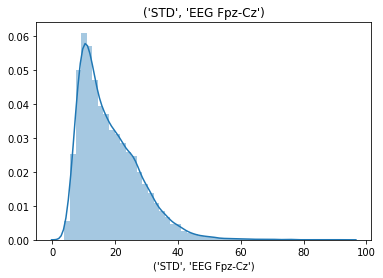

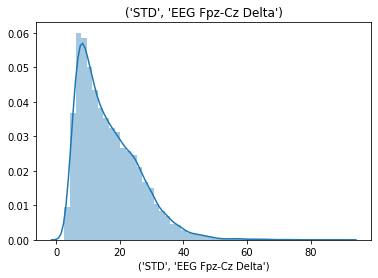

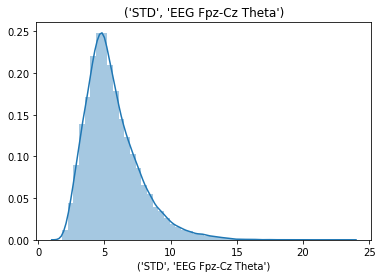

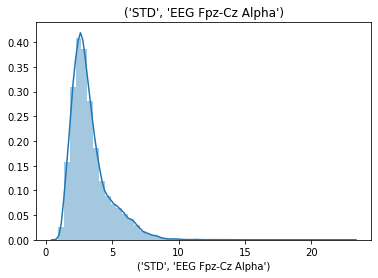

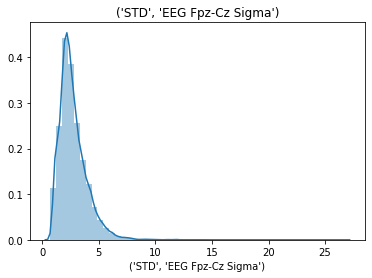

...

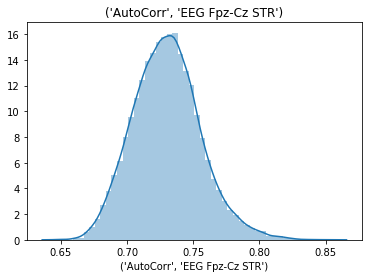

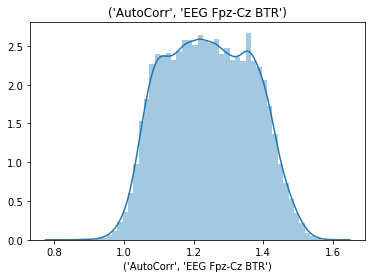

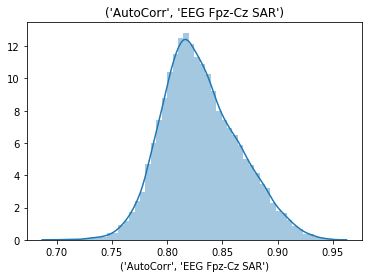

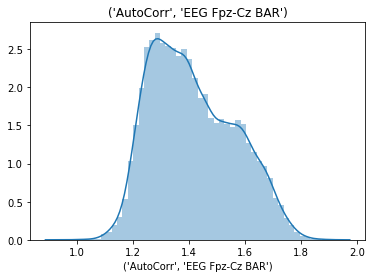

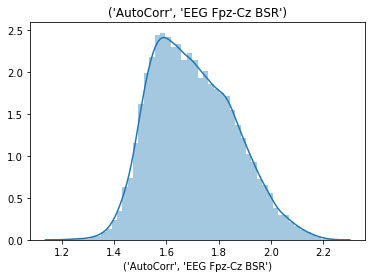

In [26]:
results_dir = 'C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/KDE/'

if not os.path.isdir(results_dir): 
    os.makedirs(results_dir)

# Dist + KDE
for col in list(train_X.columns):
    sns.distplot(train_X[col])
    plt.title(col)
    plt.savefig(results_dir + str(col) + '_KDE.png')
    plt.show()

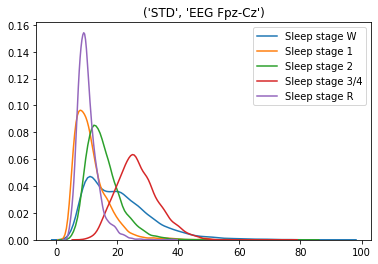

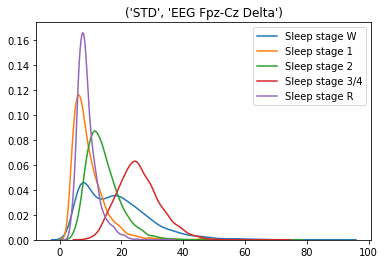

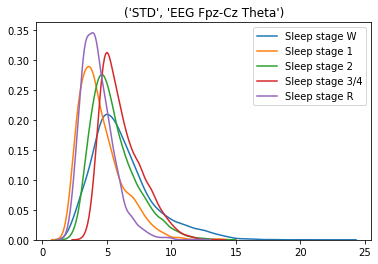

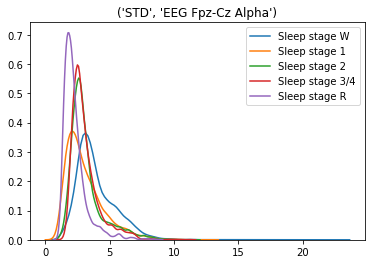

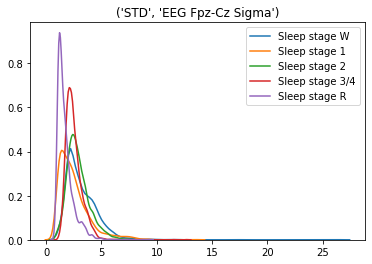

...

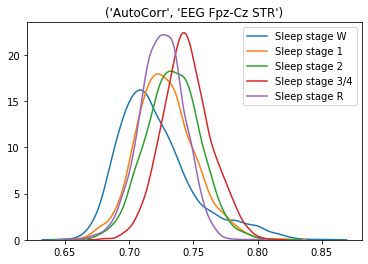

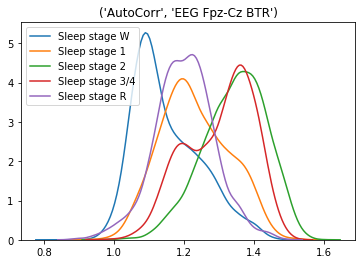

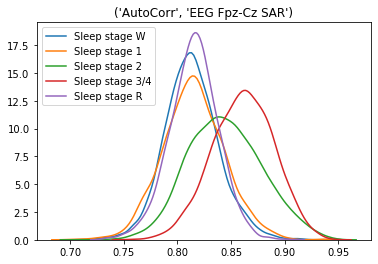

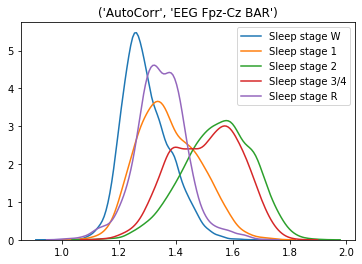

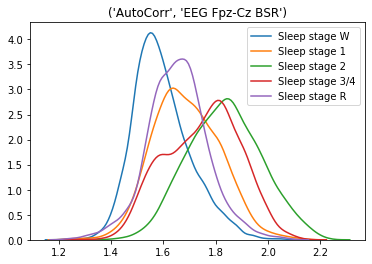

In [27]:
results_dir = 'C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/Stage_KDE/'

if not os.path.isdir(results_dir): 
    os.makedirs(results_dir)

for col in list(train_X.columns):
    plt.title(col)
    for stage in list(event_id.keys()):
        sns.kdeplot(df[df['condition'] == stage][col], label=stage)
    plt.savefig(results_dir + str(col) + '_stage_KDE.png')
    plt.show()

### Correlation matrix

results_dir = 'C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/Correlation matrix/'

if not os.path.isdir(results_dir): 
    os.makedirs(results_dir)
    
for col in tr_df.columns.get_level_values(1).unique()[1:]:
    df_corr = tr_df.xs(col,level=1,axis=1)[['Mean_frequency','SpectEn']].corr()
    plt.figure()
    plt.title(col)
    sns.heatmap(df_corr,annot=True)
    plt.savefig(results_dir + str(col) + '_Correlation matrix.png')
    